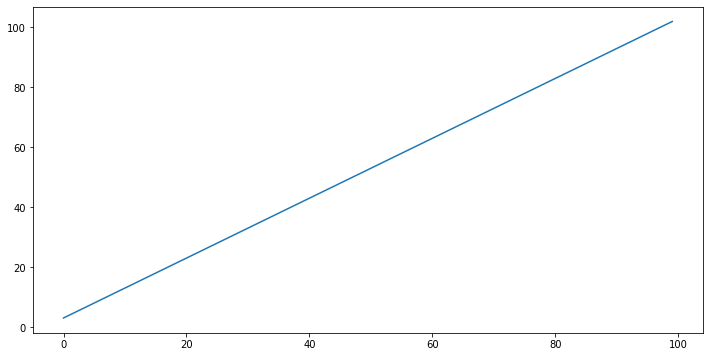

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

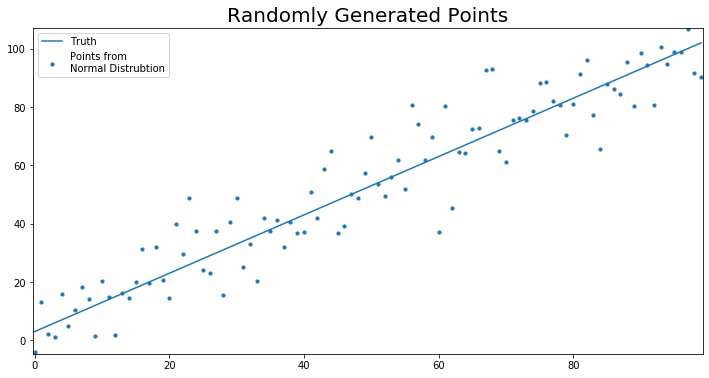

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

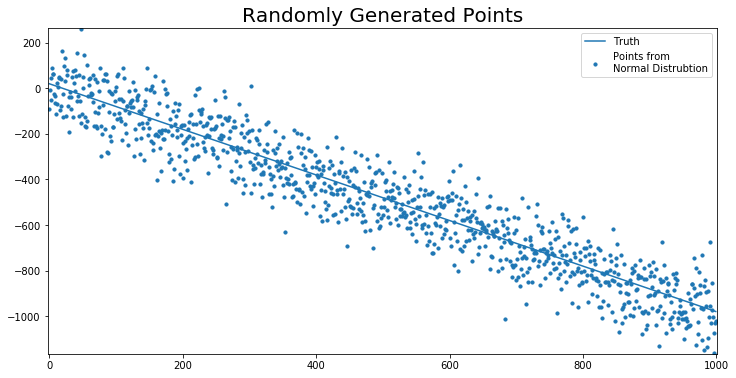

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

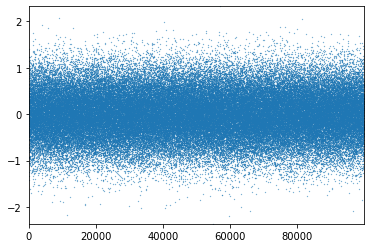

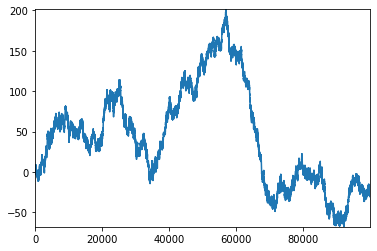

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)
        



In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.382624,1.404603,0.428194,-0.570040,-1.381857,-1.665325,1.005269,-0.297328,-2.505364,1.803751,...,-0.346323,-0.223001,0.496157,0.016977,-0.665484,0.950082,-1.592728,-0.080146,-1.428032,0.233162
1,-0.034534,-0.596817,-0.414006,0.486640,0.068167,0.287844,0.102394,0.738988,0.825768,-0.629404,...,1.256531,0.153391,1.462361,-0.057613,2.164328,1.600343,0.623264,1.715725,0.670777,-1.077631
2,-0.094589,0.043666,0.136255,0.405978,-0.665603,0.086693,-0.786496,-0.567664,0.409883,-0.057493,...,1.031686,0.129109,1.262949,-0.041368,0.508254,0.139380,-0.963998,-0.128462,-2.042885,0.099417
3,-0.930214,-0.332593,0.852891,-1.013818,-0.156591,0.271935,-0.901863,1.059856,-1.758150,-0.695956,...,0.836937,0.643118,0.992383,-0.687371,-2.623572,0.420142,-0.853780,-0.876732,-1.533444,-2.395773
4,-0.142218,0.109512,0.357309,2.032275,0.918398,-0.714115,2.781391,-0.125182,-0.237750,-0.254604,...,0.309776,1.070363,-1.084401,1.222005,-1.221774,0.246541,-1.205634,-0.781824,-0.448684,-0.154149
5,2.077819,-0.943676,1.100550,0.617626,1.044525,0.372790,-0.893516,0.607605,0.358438,0.818264,...,-1.201811,-0.382827,-0.669068,0.069075,-0.293945,-0.726225,0.014267,-0.289055,-0.688402,0.889933
6,-0.760364,-1.300227,0.540202,1.571135,0.561990,-1.088639,1.339097,0.509423,-0.768002,1.114151,...,0.175106,-0.443278,-0.371807,0.150283,0.137077,-1.174818,-0.746773,-2.082255,0.610178,-0.696646
7,0.421504,-1.059141,0.182686,-0.120289,0.241328,0.732517,0.864111,0.867393,0.938714,-2.425174,...,-1.150284,-0.831331,0.694490,-0.866220,-0.560104,0.628254,-0.244114,-0.545768,0.702677,-1.387533
8,0.524351,0.322957,0.192229,0.318424,-0.208923,0.234586,-0.846676,-0.884469,-1.393236,0.468317,...,-0.046068,-0.055309,-1.051100,0.452629,-0.921476,-0.007576,-0.785434,-2.095953,-1.536773,1.471532
9,-0.354882,0.517083,0.165501,-0.589469,-0.129045,1.211500,0.054977,-0.465843,-1.350817,-0.307087,...,-0.317087,-0.662095,-1.261866,-0.048161,-0.892152,-0.603476,-0.145362,1.688136,0.068924,-1.253177


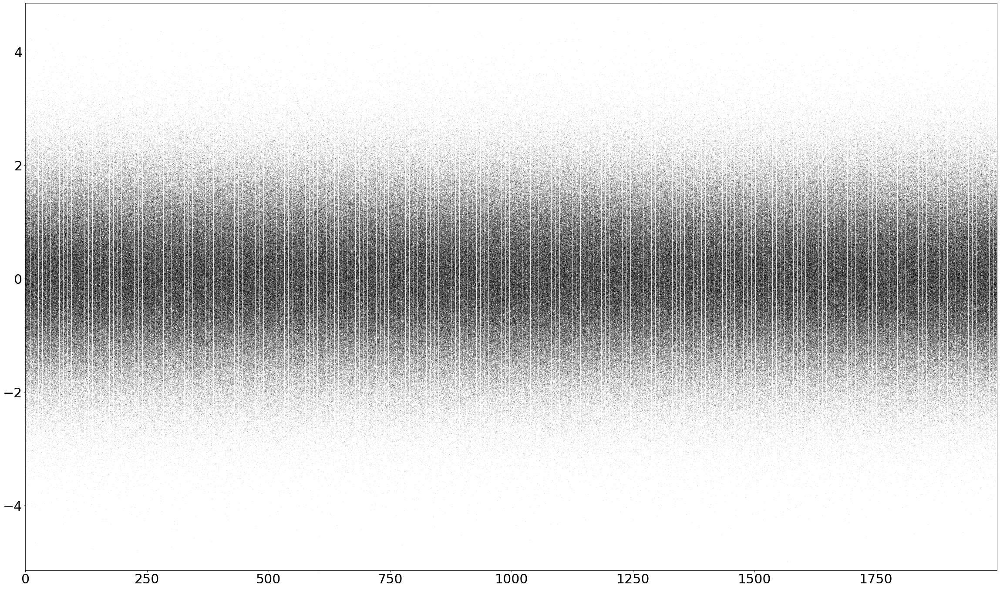

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

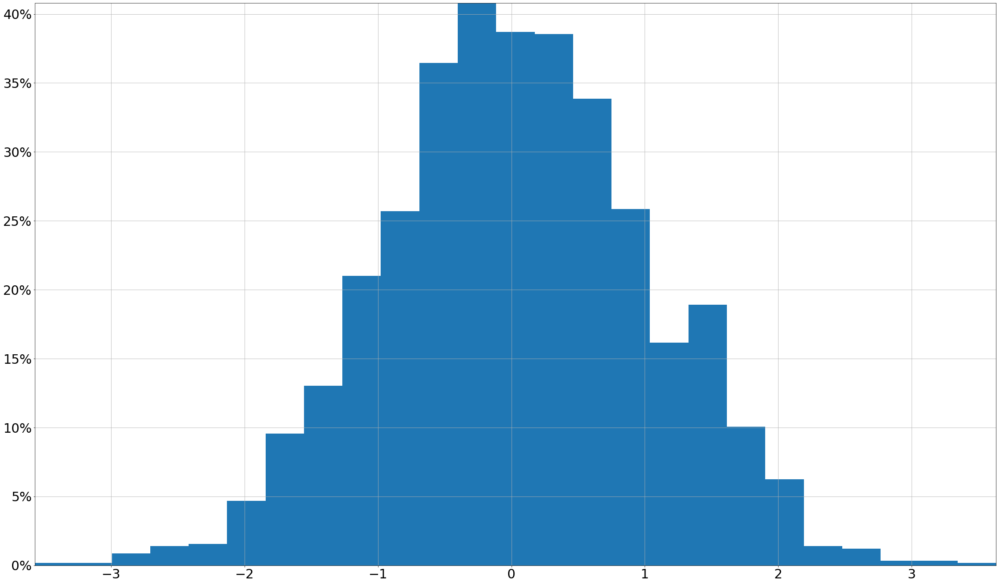

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.597989,0.083189,0.099652,-0.073727,-0.135290,0.725156,0.379439,-0.191942,0.171334,0.546851,...,0.580236,-0.238159,0.662950,0.694230,0.059079,-0.206530,0.913496,0.578214,-0.003176,-0.088599
1,-0.148763,0.900480,0.643435,0.018862,-0.562362,0.324831,0.616700,0.382471,0.109700,0.539375,...,0.876522,0.437896,0.567307,0.418106,0.255234,0.054101,0.068416,-0.317514,0.184120,0.175652
2,-0.031570,1.236104,1.278288,-0.306838,-0.113365,0.226198,1.189793,0.076922,0.182588,0.228128,...,0.513622,0.207398,1.055204,-0.036137,-0.398932,-0.419619,-0.138338,-0.086872,0.087569,-0.165379
3,1.273474,1.158256,0.845701,-0.314495,0.366335,0.215699,1.190677,-0.226579,0.047700,-0.283514,...,0.855294,0.658772,0.871036,-0.036632,-0.336869,-0.331968,0.413737,-0.487375,0.556222,0.187799
4,1.099012,0.525414,-0.109816,-0.414390,1.129877,0.145500,1.059707,-0.129141,-1.100227,0.150559,...,0.287983,0.982504,1.073228,-0.202635,-0.601073,-0.309861,1.704351,-0.094642,0.353412,0.041437
5,0.019947,-0.345082,-0.244152,-1.417900,1.079864,-0.042379,2.000768,0.285334,-1.353063,0.399297,...,0.640591,1.529526,1.539842,0.125947,0.145866,-0.669588,0.453011,0.347465,-0.125499,0.810352
6,0.382457,0.501669,-1.017141,-1.332330,1.533940,-0.075024,2.075757,-0.038590,-0.863719,0.432998,...,1.242756,1.444693,1.331850,-0.235552,0.235012,-0.878918,1.348732,0.057212,0.775179,0.238719
7,0.508555,0.212333,-0.988630,-1.167877,1.650825,0.136883,2.323946,0.330731,-0.735052,0.630756,...,0.587165,1.323725,0.735279,0.169544,0.467767,-0.645423,1.279977,0.253668,0.556136,0.313615
8,1.139951,0.367508,-0.462901,-1.534327,1.865746,-0.173351,2.168209,-0.091191,-0.563157,1.223840,...,1.375601,1.308268,1.876840,0.612534,-0.593189,-1.085591,1.819154,0.143257,0.149138,0.540785
9,1.826059,0.458860,-0.732750,-2.260615,1.933663,0.339489,2.571244,0.250735,-0.617342,0.784900,...,0.822814,0.732827,1.858441,1.272036,-1.052959,-0.247962,1.756124,0.426559,-0.247239,-0.069394


In [10]:
def plot_monte_carlo_sim(sim_data,  title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = logy, ax = ax)
    index = list(sim_data.index) 
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

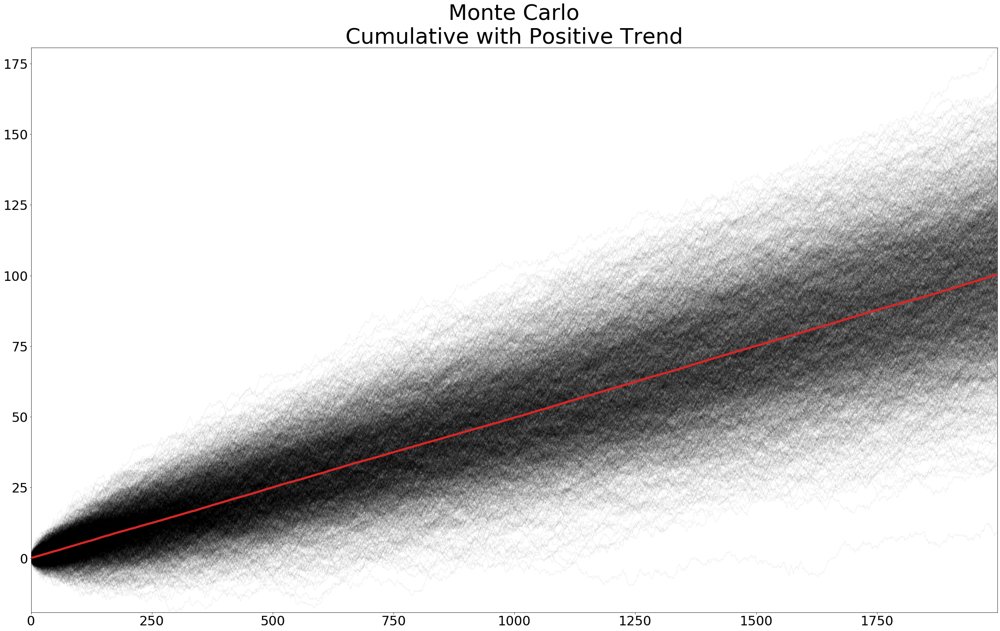

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
    title = "Monte Carlo\nCumulative with Positive Trend", logy = False)


### Calculating Expected Value

In [12]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.057198
1         0.105068
2         0.139992
3         0.186965
4         0.243091
5         0.278616
6         0.324414
7         0.382151
8         0.433085
9         0.477658
10        0.520241
11        0.567437
12        0.615987
13        0.666736
14        0.711334
15        0.774116
16        0.823988
17        0.865756
18        0.900653
19        0.946206
20        0.990341
21        1.067545
22        1.132437
23        1.177939
24        1.218445
25        1.248443
26        1.311026
27        1.369860
28        1.412853
29        1.449285
           ...    
1970     98.817006
1971     98.873103
1972     98.909025
1973     98.961458
1974     99.016288
1975     99.060346
1976     99.109853
1977     99.171259
1978     99.222140
1979     99.288941
1980     99.358532
1981     99.421217
1982     99.497108
1983     99.529241
1984     99.578832
1985     99.631956
1986     99.679843
1987     99.735700
1988     99.792833
1989     99.830177
1990     99.886541
1991     99.

### Simulating Changes in Portfolio Values

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)

# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072812,-0.004366,0.028109
2005-01-10,0.004874,-0.004188,-0.001044,0.006242
2005-01-11,-0.002612,-0.063805,-0.007107,-0.007792
2005-01-12,0.001871,0.013941,0.002211,0.009507
2005-01-13,-0.019044,0.066300,-0.007982,-0.000256


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094170,0.979847,0.956292
2005-01-10,1.002244,1.089588,0.978824,0.962261
2005-01-11,0.999626,1.020066,0.971867,0.954763
2005-01-12,1.001496,1.034287,0.974015,0.963840
2005-01-13,0.982423,1.102860,0.966240,0.963593


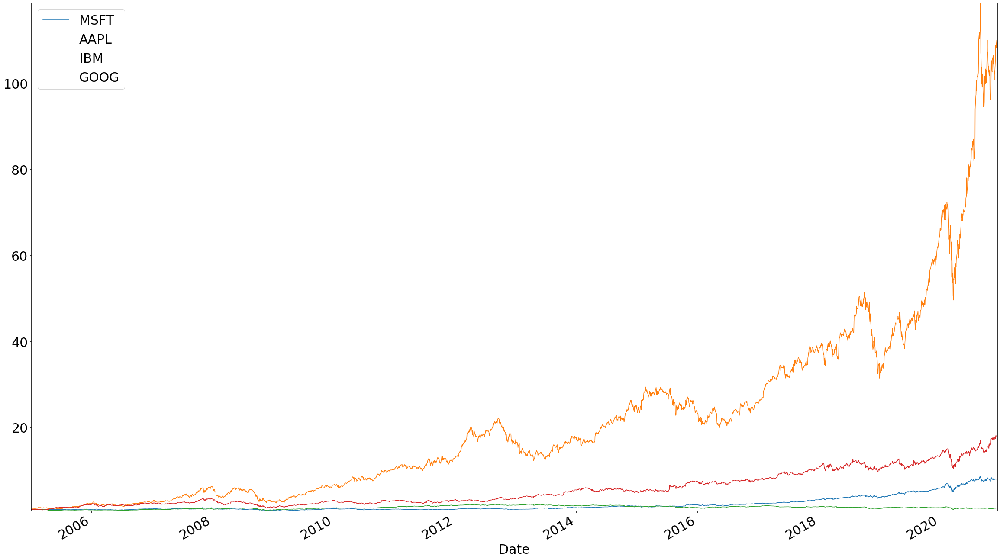

In [16]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [17]:
mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000516,0.017283
AAPL,0.001166,0.021036
IBM,0.000061,0.014579
GOOG,0.000714,0.018819


In [18]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()


In [19]:
monte_carlo_sim_dict

{'MSFT':                   0         1         2         3         4         5    \
 2005-01-03   1.019859  0.987966  0.986940  0.986496  1.012077  0.993004   
 2005-01-04   0.993784  0.956967  0.974899  1.012404  1.002534  0.983152   
 2005-01-05   1.019516  0.966974  0.984949  1.040114  0.989188  0.961928   
 2005-01-06   1.017950  0.977634  0.989140  1.009875  0.948157  0.968904   
 2005-01-07   1.011622  1.014331  0.993065  1.004069  0.959117  0.963197   
 2005-01-10   1.039406  1.021150  0.993425  0.999056  0.930353  0.946504   
 2005-01-11   1.009261  1.022873  1.013594  0.991090  0.898179  0.947754   
 2005-01-12   1.006011  1.017170  0.992407  0.986859  0.895344  0.927205   
 2005-01-13   1.003004  1.048809  0.994742  0.981194  0.888018  0.917240   
 2005-01-14   0.980894  1.017222  0.986216  0.994459  0.919696  0.915946   
 2005-01-18   0.972434  1.024559  0.988647  0.951015  0.892326  0.902352   
 2005-01-19   0.965175  0.999911  1.010201  0.956985  0.877710  0.945698   
 200

In [20]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "C2", linewidth = 5, logy = logy, ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
    
    
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

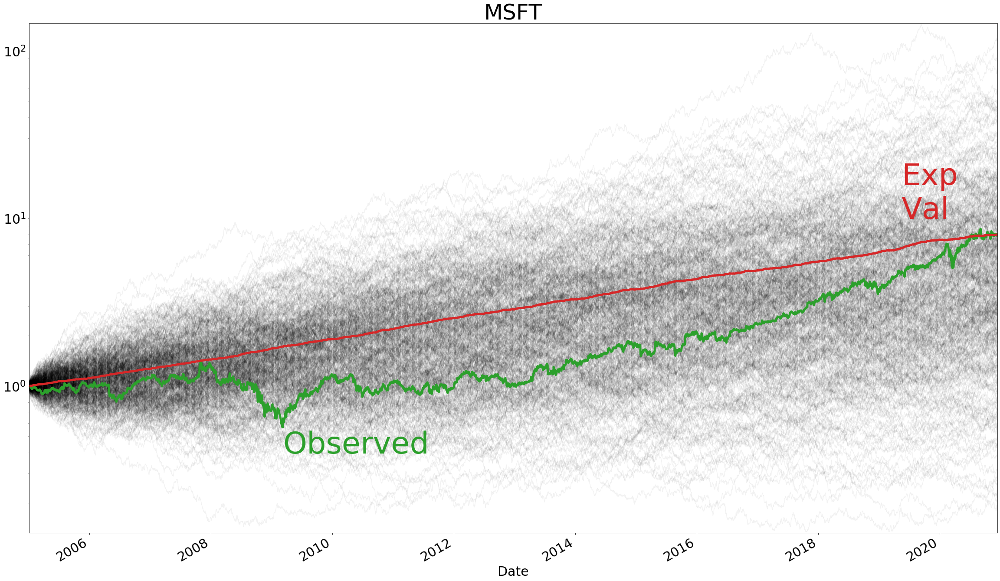

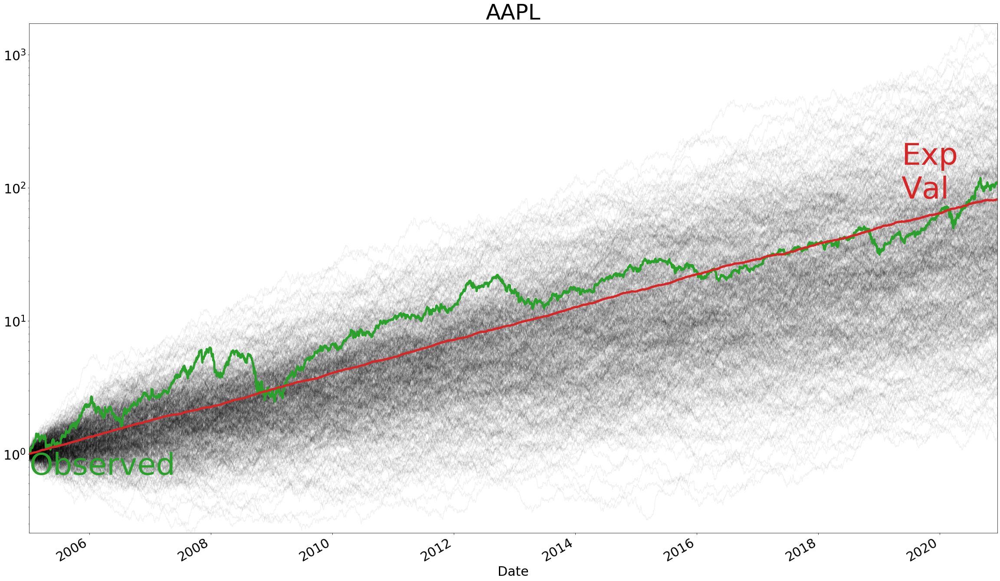

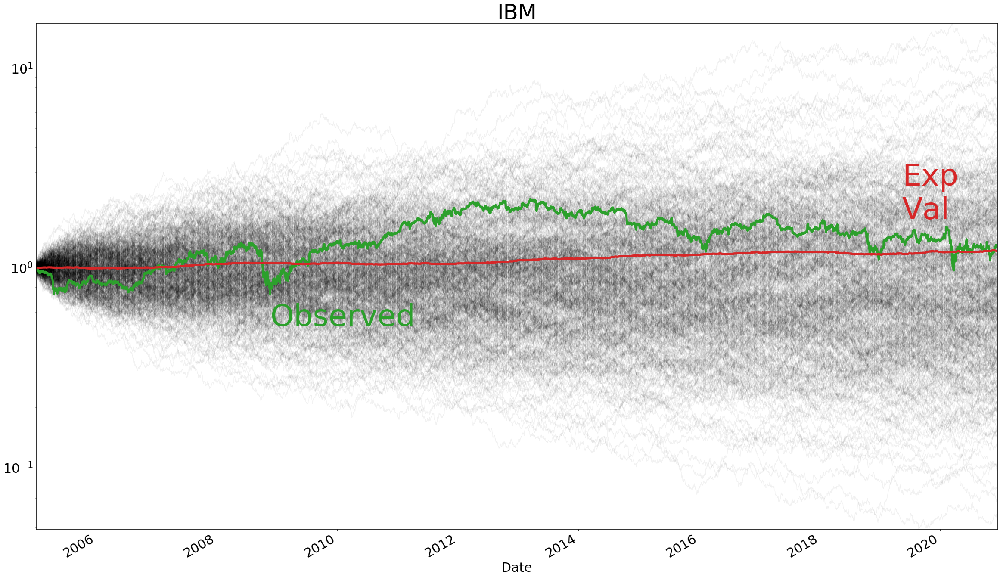

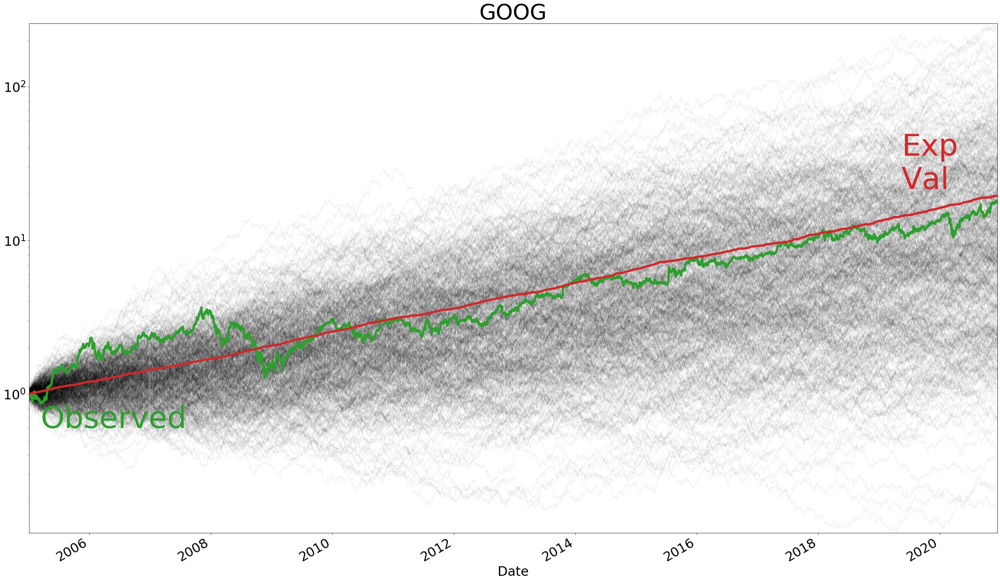

In [21]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dict[stock], close_data_normalized[stock], stock, logy= True)


## Calculate Portfolio Return

In [22]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [23]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094170,0.979847,0.956292,1.006923
2005-01-10,1.002244,1.089588,0.978824,0.962261,1.008229
2005-01-11,0.999626,1.020066,0.971867,0.954763,0.986581
2005-01-12,1.001496,1.034287,0.974015,0.963840,0.993409
2005-01-13,0.982423,1.102860,0.966240,0.963593,1.003779


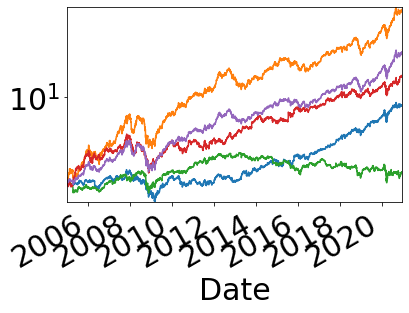

In [24]:
close_data_normalized.plot.line(legend=False, logy = True)

In [25]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001297
2005-01-11,-0.021472
2005-01-12,0.006922
2005-01-13,0.010439
2005-01-14,0.004986


In [26]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000876,0.0166


In [27]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,0.984174,0.995895,1.002887,1.008984,1.006674,1.015897,0.973352,0.977195,0.990967,1.011798,...,1.019066,0.977210,0.972423,0.987270,0.979759,1.005813,1.002119,0.998492,0.993636,0.999922
2005-01-04,0.999350,1.009318,0.978716,0.998728,1.000625,1.005349,0.970421,0.964514,1.012807,1.018537,...,1.020280,0.969904,0.959597,1.017775,0.958266,1.008253,1.005116,1.011195,0.984048,1.025674
2005-01-05,1.044095,1.001949,0.999316,1.014018,0.995324,0.966977,0.961391,0.951687,1.000359,0.990894,...,1.014594,0.987797,0.966187,1.030694,0.966474,1.024889,1.004661,0.998087,0.992444,1.038696
2005-01-06,1.057544,1.015228,1.010485,1.059115,0.975329,0.947457,0.950931,0.927499,0.996830,0.982762,...,1.023727,0.987569,0.957138,1.026292,0.981000,1.026740,1.006843,1.005076,0.991300,1.028112
2005-01-07,1.103932,1.029774,0.997203,1.048896,0.969414,0.937709,0.941158,0.905139,0.989960,0.991497,...,1.003276,1.004691,0.967608,1.039165,0.999264,1.018107,1.038167,0.979899,1.010164,1.025607
2005-01-10,1.104457,1.025765,0.973640,1.059407,0.969870,0.961896,0.976599,0.909406,0.991279,0.995393,...,0.988025,1.016732,0.951797,1.040294,0.969113,1.027683,0.999025,0.961945,0.981672,1.035969
2005-01-11,1.084224,1.031901,0.961500,1.041189,0.979283,0.968915,0.969727,0.895663,0.982424,0.983754,...,0.984652,1.015824,0.953029,1.038195,0.966891,1.019583,0.998431,0.975601,1.002745,1.044390
2005-01-12,1.085240,1.017226,0.973834,1.051578,0.966438,0.978126,0.948746,0.875539,0.953784,0.981921,...,1.023295,1.020328,0.963670,1.028541,0.981078,1.008138,0.971667,0.980608,0.987833,1.053864
2005-01-13,1.071214,1.042585,0.978366,1.050304,0.976679,0.990640,0.952518,0.872027,0.944184,1.007785,...,1.024219,1.020640,0.950976,1.020992,1.007239,1.022060,0.987440,0.958043,0.982018,1.057543
2005-01-14,1.058222,1.038870,0.982162,1.066841,0.957713,0.977768,0.964791,0.881746,0.924510,1.019951,...,1.026171,1.041285,0.947901,0.997346,0.978960,1.018028,1.021162,0.922963,1.000303,1.047905


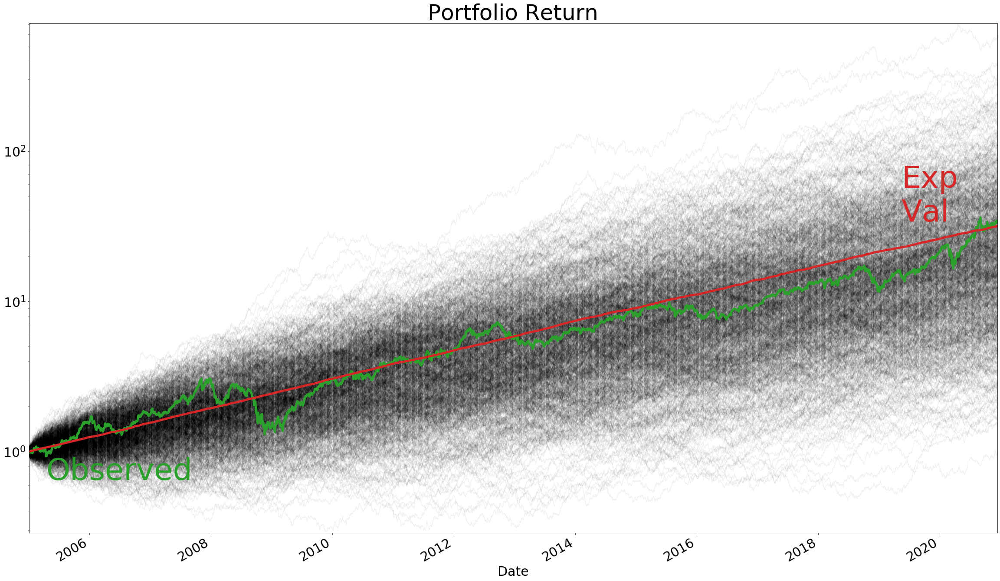

In [28]:
plot_monte_carlo_sim(monte_carlo_sim_df, ex_return["Portfolio Return"], "Portfolio Return", logy= True)